This notebook will guide you through how to load, set and infer with UniCon models.

## Load model   

In [1]:
%reload_ext autoreload
%autoreload 2

import os
# os.environ["HF_ENDPOINT"] = "https://hf-mirror.com"
# os.environ["HF_HOME"] = "/home/bml/storage/mnt/v-95c5b44cfcff4e6c/org/data_lxr/.cache/huggingface"
from pipeline.pipeline_unicon import StableDiffusionUniConPipeline
from utils.load_utils import load_model_configs, load_unicon

model_configs = load_model_configs()
pipeline_class = StableDiffusionUniConPipeline
pipe = load_unicon(pipeline_class, [model_configs["depth"]])

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'pipeline.pipeline_unicon.StableDiffusionUniConPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


UniCon pipeline loaded. Base model: runwayml/stable-diffusion-v1-5
UniCon layers initialized.
depth model weights loaded


## Inference
You need to set some input configs before inference. "sample schedule" specifies the denoising schedules for each inupt. "input pairs" determines how to pair the input images and which model to use in our joint cross attention modules.

In [2]:
from PIL import Image

# Load inputs
cond_path = "data/example_inputs/bench_dog_depth.png"
cond_input = Image.open(cond_path).convert("RGB")
image_input = Image.new('RGB', (512, 512), (255, 255, 255))

model_name = "depth"
input_images = [image_input, cond_input]

# Set input configs
sample_schedule = [[(0, 1), (1, 1), 0]]
input_pairs = [(0, 1, 1.0, 1.0, model_name)]

input_config = {
    "input_images" : input_images,
    "sample_schedule" : sample_schedule,
    "input_pairs": input_pairs
}

# Set input prompt
depth_config = model_configs[model_name]
prompt = "a dog on the bench"
prompts = [prompt, depth_config["trigger_word"] + prompt]

Then run inference

  0%|          | 0/50 [00:00<?, ?it/s]

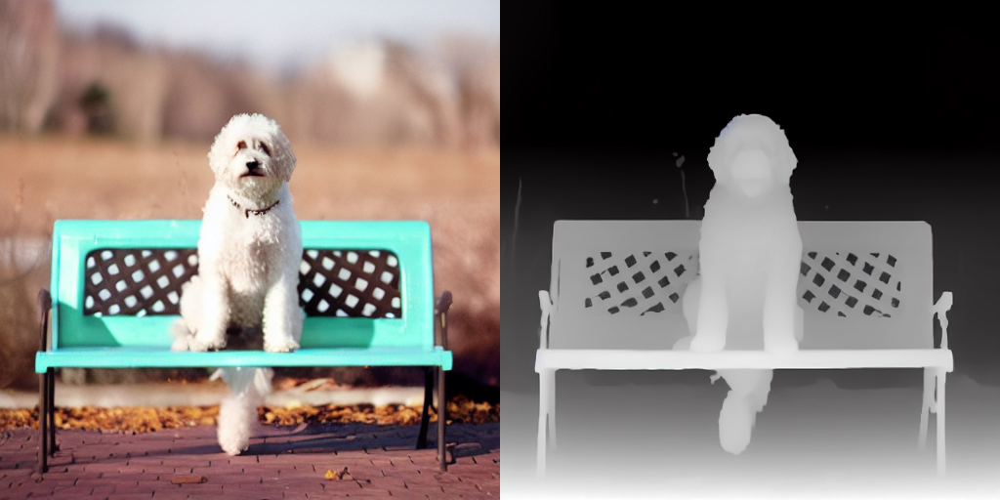

In [3]:
from utils.utils import unicon_infer
from diffusers.utils import make_image_grid

images = unicon_infer(pipe, input_config, prompt = prompts, batch_size=1, seed = 123)
make_image_grid([*images], rows=1, cols=2)

## Inference with multiple UniCon models
We can combine multiple UniCon models for multi-signal conditional generation. You only need to associate each signal with different models in "input_pairs".

In [4]:
from utils.load_utils import load_one

appearance_config = model_configs["appearance"]
load_one(pipe.unet, appearance_config)
unicon_adapters = pipe.unet.unicon_config["unicon_adapters"]
active_adapters = unicon_adapters["appearance"] + unicon_adapters["depth"]
pipe.unet.set_adapters(active_adapters)

depth_path = "data/example_inputs/human_depth.png"
depth_input = Image.open(depth_path).convert("RGB")
ref_path = "data/example_inputs/human_ref.png"
ref_input = Image.open(ref_path).convert("RGB")
image_input = Image.new('RGB', (512, 512), (255, 255, 255))

input_images = [image_input, depth_input, ref_input]

sample_schedule = [[(0, 1), (1, 1), (1, 1), 0]]
input_pairs = [
        (0, 1, 1.0, 1.0, "depth"),
        (0, 2, 1.0, 1.0, "appearance"),
    ]
input_config = {
    "input_images" : input_images,
    "sample_schedule" : sample_schedule,
    "input_pairs": input_pairs
}
prompt = "best quality, a man wearing shirts"
prompts = [prompt, depth_config["trigger_word"] + prompt, appearance_config["trigger_word"] + prompt]


appearance model weights loaded


  0%|          | 0/50 [00:00<?, ?it/s]

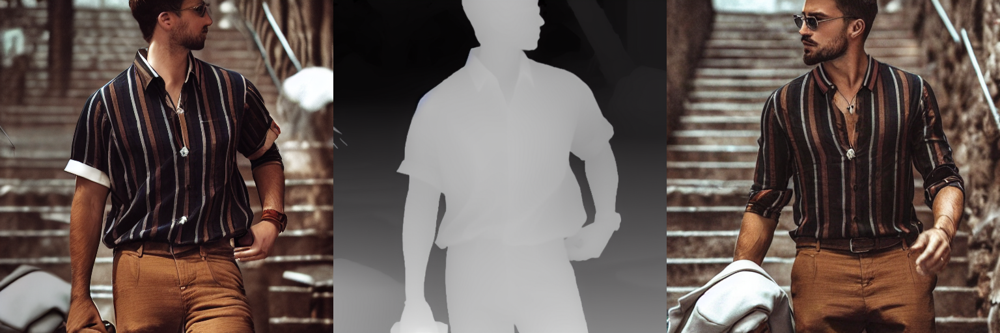

In [5]:
images = unicon_infer(pipe, input_config, prompt = prompts, batch_size=1, seed = 142857)
make_image_grid([*images], rows=1, cols=3)

## Comparing Different Joint Scales
The joint scale (i.e. the factor multiplied to the joint cross attention output) affects the strength of condition. Sometimes you might want to change it for loose conditions, such as id and appreance models.

In [30]:
active_adapters = unicon_adapters["appearance"]
pipe.unet.set_adapters(active_adapters)

ref_path = "data/example_inputs/wolf_app.png"
ref_input = Image.open(ref_path).convert("RGB")
image_input = Image.new('RGB', (512, 512), (255, 255, 255))

input_images = [image_input] * 5 + [ref_input] * 5

sample_schedule = [[(0, 1)] * 5 + [(1, 1)] * 5 + [0]]
input_pairs = [
        (0, 5, 1.0, 1.0, "appearance"),
        (1, 6, 0.8, 0.8, "appearance"),
        (2, 7, 0.6, 0.6, "appearance"),
        (3, 8, 0.4, 0.4, "appearance"),
        (4, 9, 0.2, 0.2, "appearance"),
    ]
input_config = {
    "input_images" : input_images,
    "sample_schedule" : sample_schedule,
    "input_pairs": input_pairs
}
prompt_ref = "best quality, a wolf looking around"
prompt_image = "best quality, a wolf standing on a rock"
prompts = [prompt_image] * 5 + [prompt_ref] * 5

  0%|          | 0/50 [00:00<?, ?it/s]

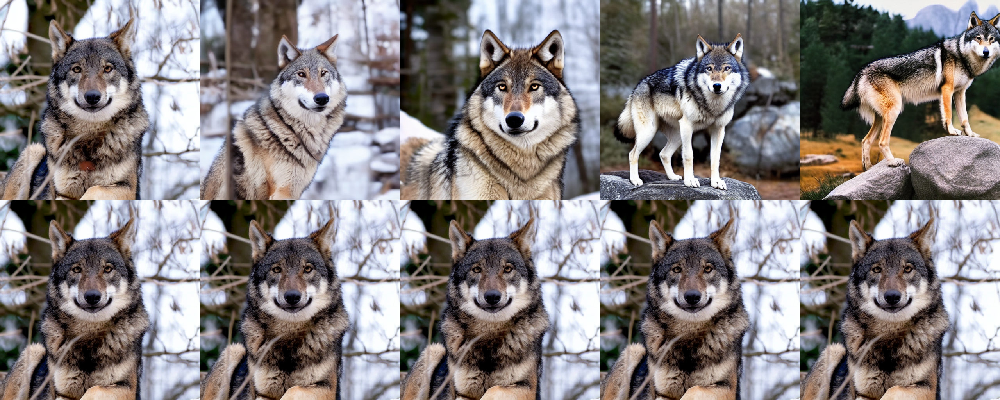

In [25]:
images = unicon_infer(pipe, input_config, prompt = prompts, batch_size=1, seed = 123)
make_image_grid([*images], rows=2, cols=5)

### Comparing Different Condition Guidance Scales
When you want to strengthen the condition signal, you can set the cond_guidance_scale. It works similar with the text CFG, just computed between the outputs with or without joint modules. It is useful for loose conditions, e.g. id and appearance models.

In [27]:
id_config = model_configs["id"]
load_one(pipe.unet, id_config)
active_adapters = unicon_adapters["id"]
pipe.unet.set_adapters(active_adapters)

id_path = "data/example_inputs/woman_id.png"
id_input = Image.open(id_path).convert("RGB")
image_input = Image.new('RGB', (512, 512), (255, 255, 255))

input_images = [image_input, id_input]

sample_schedule = [[(0, 1), (1, 1), 0]]
input_pairs = [
        (0, 1, 1.0, 1.0, "id"),
    ]
input_config = {
    "input_images" : input_images,
    "sample_schedule" : sample_schedule,
    "input_pairs": input_pairs
}
prompt_id = "best quality, a woman with long blonde hair and red lipstick"
prompt_image = "best quality, oil painting of a woman"
prompts = [prompt_image, prompt_id]

id model weights loaded


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

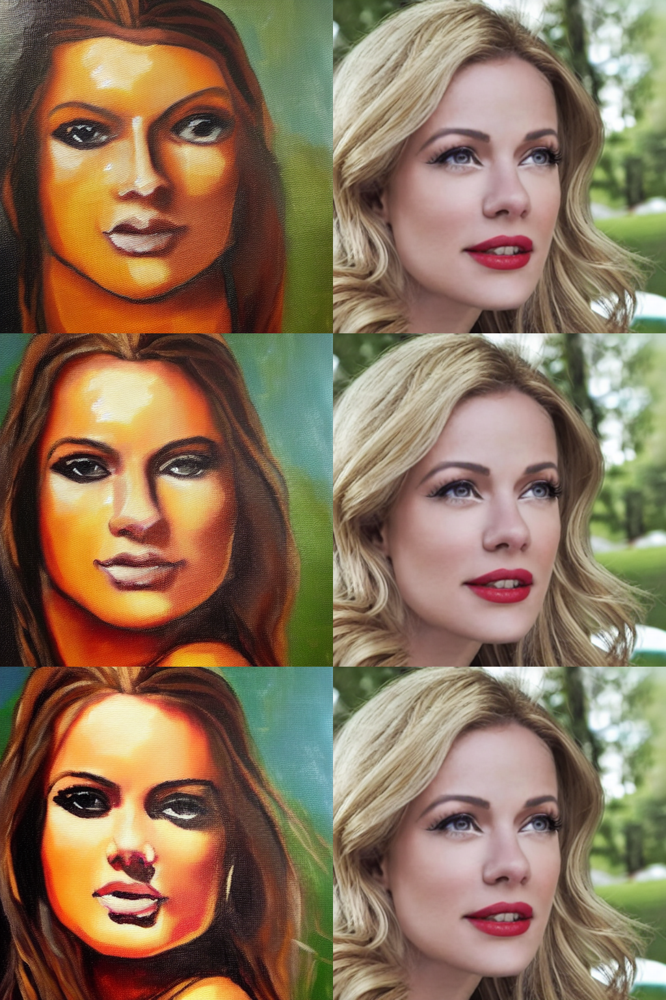

In [29]:
images_c0 = unicon_infer(pipe, input_config, prompt = prompts, batch_size=1, seed = 142857, cond_guidance_scale=0.0)
images_c1 = unicon_infer(pipe, input_config, prompt = prompts, batch_size=1, seed = 142857, cond_guidance_scale=1.0)
images_c2 = unicon_infer(pipe, input_config, prompt = prompts, batch_size=1, seed = 142857, cond_guidance_scale=2.0)
make_image_grid([*images_c0, *images_c1, *images_c2], rows=3, cols=2)